<div align="center">

<img src="https://raw.githubusercontent.com/Mirza9003/Molniya_Orbit_Geometry/main/Block-IOWA-GOLD-ffcd00.png" alt="The University of Iowa" width="260"/>

# CEE 4317: Remote Sensing — Homework #2
## Landsat 8/9 Surface Reflectance and Land Surface Temperature Analysis

**Mirza Md Tasnim Mukarram**

Informatics, Dept. of Computer Science · Geography, SEES
The University of Iowa

</div>

---

|  |  |
|---|---|
| **Study area** | Iowa scene |
| **Dates** | Early June and mid-September |
| **Sensor** | Landsat 8/9 (OLI + TIRS) |
| **Products** | Collection 2 Level-2 Surface Reflectance & Surface Temperature |
| **Due** | Tuesday, 09/22/2026 |

---

## Notebook workflow

This notebook is organized to show the analysis logic from the beginning rather than assuming the band structure.

1. Upload the two GeoTIFF stacks from the local computer.
2. Inspect raster metadata and raw band statistics.
3. Visualize all raw bands and validate the supplied band order.
4. Inspect the `QA_PIXEL` layer and mask cloud and cloud-shadow pixels.
5. Apply the stated Landsat scale factors.
6. Answer **Part A: Concepts**.
7. Complete **Part B: Data analysis** in the same order as the homework.
8. Use the numerical and spatial results to answer **Part C: Discussion**.

The homework states that the seven-band stacks are ordered as:

**Blue, Green, Red, NIR, SWIR1, ST_B10, QA_PIXEL**

The exploratory steps below independently check that this structure is consistent with the numerical ranges and spatial behavior before any band math is performed.

In [22]:
# ============================================================
# SETUP — Install/import packages and upload the two GeoTIFFs
# ============================================================

!pip -q install rasterio

from google.colab import files
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from matplotlib.colors import TwoSlopeNorm

# Upload BOTH GeoTIFF files from your computer.
uploaded = files.upload()

tif_files = [
    name for name in uploaded.keys()
    if name.lower().endswith((".tif", ".tiff"))
]

if len(tif_files) != 2:
    raise ValueError(
        f"Please upload exactly two GeoTIFF files. Found {len(tif_files)}: {tif_files}"
    )

# Assign dates from filenames instead of upload order.
june_candidates = [f for f in tif_files if "june" in f.lower()]
sept_candidates = [
    f for f in tif_files
    if ("sept" in f.lower()) or ("september" in f.lower())
]

if len(june_candidates) != 1 or len(sept_candidates) != 1:
    raise ValueError(
        "Could not identify one June file and one September file from the filenames.\n"
        f"Uploaded files: {tif_files}\n"
        "Rename them to include 'june' and 'sept' (or 'september'), then rerun."
    )

june_path = june_candidates[0]
sept_path = sept_candidates[0]

print("June file      :", june_path)
print("September file :", sept_path)

Saving landsat_june.tif to landsat_june (2).tif
Saving landsat_sept.tif to landsat_sept (1).tif
June file      : landsat_june (2).tif
September file : landsat_sept (1).tif


## Exploratory analysis: inspect the raw stacks

Before assigning band names in code, I first inspect the raster structure, data type, coordinate system, resolution, bounds, and raw digital-number (DN) distributions. This is useful for catching problems such as an incorrect file assignment, unexpected band count, different grids, or a band whose numerical range is inconsistent with the expected product.

In [23]:
# ============================================================
# EDA 1 — Metadata and raw band statistics
# ============================================================

def inspect_stack(path, label):
    with rasterio.open(path) as src:
        data = src.read()

        print("\n" + "=" * 72)
        print(f"{label}: {os.path.basename(path)}")
        print("=" * 72)
        print("Number of bands :", src.count)
        print("Raster shape    :", data.shape)
        print("Rows            :", src.height)
        print("Columns         :", src.width)
        print("CRS             :", src.crs)
        print("Pixel size      :", src.res)
        print("Bounds          :", src.bounds)
        print("Data types      :", src.dtypes)
        print("NoData value    :", src.nodata)

        for i in range(src.count):
            band = data[i].astype(float)
            valid = np.isfinite(band)

            print(f"\nBand {i+1}")
            print("-" * 32)
            print("Minimum          :", np.nanmin(band[valid]))
            print("Maximum          :", np.nanmax(band[valid]))
            print("Mean             :", np.nanmean(band[valid]))
            print("Median           :", np.nanmedian(band[valid]))
            print("2nd percentile   :", np.nanpercentile(band[valid], 2))
            print("98th percentile  :", np.nanpercentile(band[valid], 98))
            print("Zero-DN pixels   :", np.sum(band == 0))
            print("Finite pixels    :", np.sum(valid))

        info = {
            "count": src.count,
            "shape": (src.height, src.width),
            "crs": src.crs,
            "transform": src.transform,
            "bounds": src.bounds,
            "res": src.res
        }

    return data, info

june_raw, june_info = inspect_stack(june_path, "JUNE")
sept_raw, sept_info = inspect_stack(sept_path, "SEPTEMBER")

# Confirm that the two dates are on the same grid before pixel-by-pixel comparison.
assert june_info["count"] == 7 and sept_info["count"] == 7, "Expected seven bands."
assert june_info["shape"] == sept_info["shape"], "Raster dimensions do not match."
assert june_info["crs"] == sept_info["crs"], "CRS does not match."
assert june_info["transform"] == sept_info["transform"], "Raster grids are not aligned."

print("\nGrid check passed: the two scenes have the same shape, CRS, and transform.")


JUNE: landsat_june (2).tif
Number of bands : 7
Raster shape    : (7, 1018, 1045)
Rows            : 1018
Columns         : 1045
CRS             : EPSG:32615
Pixel size      : (30.0, 30.0)
Bounds          : BoundingBox(left=606330.0, bottom=4597260.0, right=637680.0, top=4627800.0)
Data types      : ('uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16', 'uint16')
NoData value    : None

Band 1
--------------------------------
Minimum          : 0.0
Maximum          : 28280.0
Mean             : 8717.120513061544
Median           : 8715.0
2nd percentile   : 0.0
98th percentile  : 11574.0
Zero-DN pixels   : 35435
Finite pixels    : 1063810

Band 2
--------------------------------
Minimum          : 0.0
Maximum          : 31343.0
Mean             : 9942.49178706724
Median           : 9924.0
2nd percentile   : 0.0
98th percentile  : 13768.0
Zero-DN pixels   : 35430
Finite pixels    : 1063810

Band 3
--------------------------------
Minimum          : 0.0
Maximum          : 33161.0
Mean

### How the bands are validated

The assignment provides the expected order, but the raw data are still checked before using that order.

- **Bands 1–5** should have similar optical-reflectance DN magnitudes and should preserve detailed field, road, river, and urban patterns.
- **Band 4 (NIR)** should make healthy vegetation relatively bright and open water dark.
- **Band 5 (SWIR1)** should also show water as very dark, while soil and vegetation have different contrast from NIR.
- **Band 6 (ST_B10)** should have a distinctly different DN range because it is a thermal surface-temperature product, not a reflectance band.
- **Band 7 (QA_PIXEL)** should look categorical rather than like a continuous surface and should contain repeated integer bit-coded values.

For these supplied data, the exploratory statistics and images are consistent with the stated order:

| Stack position | Product |
|---|---|
| Band 1 | Blue |
| Band 2 | Green |
| Band 3 | Red |
| Band 4 | NIR |
| Band 5 | SWIR1 |
| Band 6 | ST_B10 |
| Band 7 | QA_PIXEL |

The zero-valued border/fill pixels are also identified during exploration so they are not treated as valid surface observations.

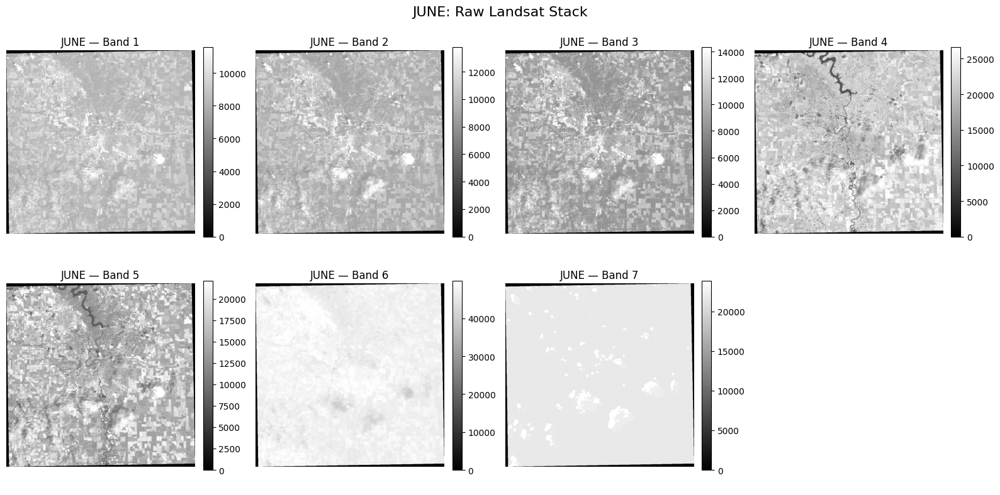

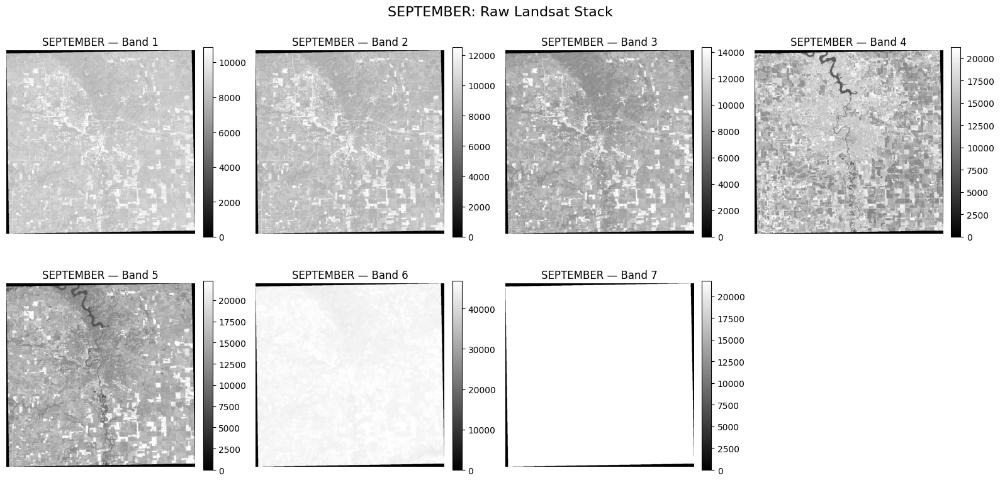

In [24]:
# ============================================================
# EDA 2 — Visualize every raw band
# ============================================================

def plot_raw_bands(data, label):
    n_bands = data.shape[0]
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.ravel()

    for i in range(n_bands):
        band = data[i].astype(float)
        valid = np.isfinite(band)

        vmin, vmax = np.nanpercentile(band[valid], [2, 98])

        im = axes[i].imshow(
            band,
            cmap="gray",
            vmin=vmin,
            vmax=vmax
        )
        axes[i].set_title(f"{label} — Band {i+1}")
        axes[i].axis("off")
        plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

    for i in range(n_bands, len(axes)):
        axes[i].axis("off")

    plt.suptitle(f"{label}: Raw Landsat Stack", fontsize=16)
    plt.tight_layout()
    plt.show()

plot_raw_bands(june_raw, "JUNE")
plot_raw_bands(sept_raw, "SEPTEMBER")

## QA_PIXEL inspection and masking

The homework instruction specifies:

- **bit 3 = cloud**
- **bit 4 = cloud shadow**

A pixel is therefore considered unusable when either of these bits is set. In addition, the exploratory analysis shows zero-DN border/fill pixels even though the GeoTIFF metadata do not define a `NoData` value, so those zero-DN fill pixels are excluded as well.

The QA mask is applied **before** NDVI, NDWI, or temperature comparisons so that cloud and shadow contamination do not enter the statistics.

In [25]:
# ============================================================
# EDA 3 — Inspect QA bits
# ============================================================

def inspect_qa(raw, label):
    qa = raw[6].astype(np.uint16)

    cloud = ((qa >> 3) & 1) == 1
    shadow = ((qa >> 4) & 1) == 1
    bad = cloud | shadow

    print("\n" + "=" * 60)
    print(f"{label} QA_PIXEL")
    print("=" * 60)
    print("Unique QA values (first 30):", np.unique(qa)[:30])
    print(f"Cloud pixels        : {cloud.sum():,}")
    print(f"Cloud-shadow pixels : {shadow.sum():,}")
    print(f"Cloud OR shadow     : {bad.sum():,}")
    print(f"Cloud/shadow percent: {100 * bad.sum() / qa.size:.2f}%")

inspect_qa(june_raw, "JUNE")
inspect_qa(sept_raw, "SEPTEMBER")


JUNE QA_PIXEL
Unique QA values (first 30): [    0 21762 21824 21890 21952 22018 22080 22280 23826 23888 24082 24144]
Cloud pixels        : 26,917
Cloud-shadow pixels : 36,343
Cloud OR shadow     : 63,260
Cloud/shadow percent: 5.95%

SEPTEMBER QA_PIXEL
Unique QA values (first 30): [    0 21762 21824 21890 21952 22018 22080 22280 23826 23888]
Cloud pixels        : 226
Cloud-shadow pixels : 961
Cloud OR shadow     : 1,187
Cloud/shadow percent: 0.11%


## Scaling and preparation

As the  homework instruction states that scale factors have **not** yet been applied.

For optical surface reflectance:

\[
\rho = DN \times 0.0000275 - 0.2
\]

For the Level-2 `ST_B10` surface-temperature product:

\[
LST\,[K] = DN \times 0.00341802 + 149.0
\]

`ST_B10` already contains the Level-2 land-surface-temperature retrieval, so **no second emissivity correction is applied**.

The optical bands and `ST_B10` are masked using the same cloud, cloud-shadow, and fill mask. Reflectance values are not arbitrarily clipped to 0–1; instead, invalid normalized-difference results are handled when the indices are calculated.

In [26]:
# ============================================================
# PROCESSING — Apply QA mask and scale factors
# ============================================================

BAND_NAMES = [
    "Blue",
    "Green",
    "Red",
    "NIR",
    "SWIR1",
    "ST_B10",
    "QA_PIXEL"
]

SR_SCALE = 0.0000275
SR_OFFSET = -0.2

ST_SCALE = 0.00341802
ST_OFFSET = 149.0

def process_stack(raw, label):
    qa = raw[6].astype(np.uint16)

    cloud = ((qa >> 3) & 1) == 1
    shadow = ((qa >> 4) & 1) == 1
    bad_qa = cloud | shadow

    # Exploratory analysis showed zero-DN border/fill pixels.
    fill = np.any(raw[:6] == 0, axis=0)

    valid = (~bad_qa) & (~fill)

    sr = {}
    for i, name in enumerate(BAND_NAMES[:5]):
        arr = raw[i].astype(float) * SR_SCALE + SR_OFFSET
        arr[~valid] = np.nan
        sr[name] = arr

    lst_k = raw[5].astype(float) * ST_SCALE + ST_OFFSET
    lst_k[~valid] = np.nan

    print("\n" + "=" * 65)
    print(label)
    print("=" * 65)
    print(f"Total pixels        : {qa.size:,}")
    print(f"Cloud pixels        : {cloud.sum():,}")
    print(f"Cloud-shadow pixels : {shadow.sum():,}")
    print(f"Cloud/shadow pixels : {bad_qa.sum():,}")
    print(f"Fill pixels         : {fill.sum():,}")
    print(f"Valid pixels        : {valid.sum():,}")
    print(f"Valid percentage    : {100 * valid.sum() / qa.size:.2f}%")

    print("\nScaled surface-reflectance statistics:")
    for name in BAND_NAMES[:5]:
        arr = sr[name]
        print(
            f"{name:6s}: mean={np.nanmean(arr):.3f}, "
            f"median={np.nanmedian(arr):.3f}, "
            f"P2={np.nanpercentile(arr,2):.3f}, "
            f"P98={np.nanpercentile(arr,98):.3f}"
        )

    print("\nST_B10 / LST statistics:")
    print(
        f"Mean   = {np.nanmean(lst_k):.2f} K "
        f"({np.nanmean(lst_k)-273.15:.2f} °C)"
    )
    print(
        f"Median = {np.nanmedian(lst_k):.2f} K "
        f"({np.nanmedian(lst_k)-273.15:.2f} °C)"
    )

    return sr, lst_k, qa, valid

june_sr, june_lst, june_qa, june_valid = process_stack(june_raw, "JUNE")
sept_sr, sept_lst, sept_qa, sept_valid = process_stack(sept_raw, "SEPTEMBER")


JUNE
Total pixels        : 1,063,810
Cloud pixels        : 26,917
Cloud-shadow pixels : 36,343
Cloud/shadow pixels : 63,260
Fill pixels         : 35,435
Valid pixels        : 965,116
Valid percentage    : 90.72%

Scaled surface-reflectance statistics:
Blue  : mean=0.047, median=0.040, P2=0.017, P98=0.107
Green : mean=0.081, median=0.074, P2=0.043, P98=0.160
Red   : mean=0.074, median=0.062, P2=0.025, P98=0.179
NIR   : mean=0.387, median=0.387, P2=0.202, P98=0.529
SWIR1 : mean=0.248, median=0.235, P2=0.108, P98=0.404

ST_B10 / LST statistics:
Mean   = 311.39 K (38.24 °C)
Median = 311.04 K (37.89 °C)

SEPTEMBER
Total pixels        : 1,063,810
Cloud pixels        : 226
Cloud-shadow pixels : 961
Cloud/shadow pixels : 1,187
Fill pixels         : 35,452
Valid pixels        : 1,027,171
Valid percentage    : 96.56%

Scaled surface-reflectance statistics:
Blue  : mean=0.043, median=0.037, P2=0.018, P98=0.099
Green : mean=0.068, median=0.061, P2=0.034, P98=0.145
Red   : mean=0.079, median=0.071

# Part A. Concepts
#This is my sample answer but in main word file i will explain in detail.
## 1) Why Level-2 surface reflectance is important for comparing June and September NDVI

NDVI is calculated from red and near-infrared reflectance:

\[
NDVI=\frac{\rho_{NIR}-\rho_{Red}}{\rho_{NIR}+\rho_{Red}}
\]

For a seasonal comparison, the goal is to interpret a change in NDVI as a change in the land surface, especially vegetation condition or phenology. Level-1 data represent radiance or top-of-atmosphere measurements and still contain atmospheric effects. Aerosols, haze, water vapor, and atmospheric scattering/absorption can differ between the June and September acquisitions and can affect the red and NIR bands differently. That can create an apparent NDVI difference even if the surface itself has not changed.

Level-2 surface reflectance applies atmospheric correction to estimate the reflectance leaving the land surface. This makes the two dates more physically comparable and reduces the chance that the June–September NDVI difference is mainly an atmospheric artifact. Cloud and cloud-shadow masking is still required because surface-reflectance processing does not make cloudy pixels usable.

## 2) Best band or index for each application

| Application | Best choice | Justification |
|---|---|---|
| **a) Mapping open water** | **NDWI = (Green − NIR)/(Green + NIR)** | Open water generally reflects more in the visible green band than in NIR, while NIR is strongly absorbed by water. This gives open water relatively high or positive NDWI compared with most vegetation and soil. |
| **b) Separating snow from cloud** | **NDSI = (Green − SWIR1)/(Green + SWIR1)** | Snow is bright in the visible green band but strongly absorbs SWIR radiation. Many clouds remain relatively reflective in SWIR, so the Green–SWIR1 contrast is useful for distinguishing snow from cloud. |
| **c) Detecting crop water stress before visible wilting** | **Thermal infrared / LST from ST_B10** | Water-stressed vegetation reduces stomatal conductance and evapotranspiration. With less evaporative cooling, canopy/surface temperature can rise before strong visible symptoms appear. Thermal temperature is therefore a more direct early indicator of stress than visible color alone. |
| **d) Urban heat mapping** | **Land surface temperature from ST_B10** | Urban heat mapping requires the spatial pattern of surface temperature. The Level-2 ST_B10 product directly provides retrieved LST, making it more appropriate than a visible or reflectance index for mapping hot and cool surfaces. |

## 3) Physical effects in an LST retrieval and emissivity-error sign

Two important physical effects are:

1. **Atmospheric transmission and atmospheric path radiance.** The atmosphere absorbs part of the surface-emitted thermal radiation and also adds upwelling thermal emission between the surface and sensor.
2. **Surface emissivity and reflected downwelling sky radiation.** A real surface is not a perfect blackbody. Its emitted radiance depends on emissivity, and the non-emitted fraction can include reflected thermal radiation from the atmosphere.

If atmospheric and reflected-sky contributions have already been corrected or are negligible, the surface thermal radiance can be simplified to

\[
L \approx \epsilon B(T)
\]

For vegetation with \(\epsilon \approx 0.98\), the measured radiance is slightly lower than the radiance of a blackbody at the same physical temperature. If the retrieval incorrectly assumes \(\epsilon=1\), it interprets that lower radiance entirely as a lower blackbody temperature. Therefore, the retrieved temperature is **biased low**. The sign of the temperature error is **negative**.

# Part B. Data analysis

## B1) True-color and false-color composites

A true-color composite uses **Red–Green–Blue** as display RGB. A false-color vegetation composite uses **NIR–Red–Green** as display RGB. The false-color composite is especially useful because healthy vegetation has strong NIR reflectance and therefore appears bright/red in the standard NIR–R–G display.

For display only, each channel is contrast-stretched using the 2nd and 98th percentiles. This does **not** change the values used in the quantitative analysis.

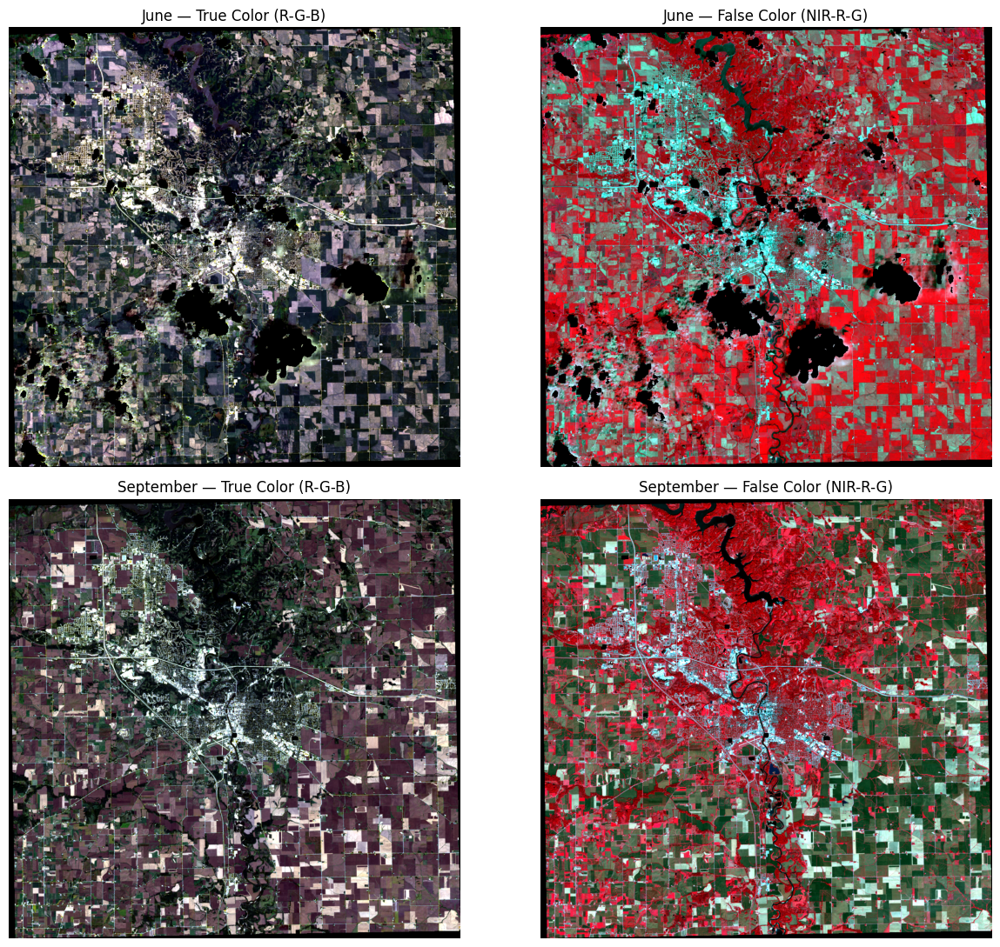

In [27]:
# ============================================================
# B1 — True color and false color (NIR-R-G)
# ============================================================

def stretch_for_display(arr, p_low=2, p_high=98):
    out = arr.astype(float).copy()
    finite = np.isfinite(out)

    if not np.any(finite):
        return np.zeros_like(out, dtype=float)

    lo, hi = np.nanpercentile(out[finite], [p_low, p_high])
    stretched = (out - lo) / (hi - lo)
    stretched = np.clip(stretched, 0, 1)
    stretched[~finite] = np.nan
    return stretched

def make_composite(sr, r_name, g_name, b_name):
    r = stretch_for_display(sr[r_name])
    g = stretch_for_display(sr[g_name])
    b = stretch_for_display(sr[b_name])
    rgb = np.dstack([r, g, b])

    # Show masked pixels as black in composites.
    rgb = np.nan_to_num(rgb, nan=0.0)
    return rgb

june_true = make_composite(june_sr, "Red", "Green", "Blue")
june_false = make_composite(june_sr, "NIR", "Red", "Green")

sept_true = make_composite(sept_sr, "Red", "Green", "Blue")
sept_false = make_composite(sept_sr, "NIR", "Red", "Green")

fig, axes = plt.subplots(2, 2, figsize=(13, 11))

axes[0,0].imshow(june_true)
axes[0,0].set_title("June — True Color (R-G-B)")

axes[0,1].imshow(june_false)
axes[0,1].set_title("June — False Color (NIR-R-G)")

axes[1,0].imshow(sept_true)
axes[1,0].set_title("September — True Color (R-G-B)")

axes[1,1].imshow(sept_false)
axes[1,1].set_title("September — False Color (NIR-R-G)")

for ax in axes.ravel():
    ax.axis("off")

plt.tight_layout()
plt.show()

## B2) NDVI and seasonal NDVI change

NDVI is computed as

\[
NDVI=\frac{NIR-Red}{NIR+Red}
\]

The seasonal change is

\[
\Delta NDVI = NDVI_{September}-NDVI_{June}
\]

Only pixels that remain valid after the QA/fill mask are used. Normalized-difference values are also rejected if the denominator is non-positive or if the result falls outside the physically meaningful range \([-1,1]\). For \(\Delta NDVI\), a pixel must be valid on **both dates**.

A diverging color scale centered at zero is used for \(\Delta NDVI\): negative values indicate lower NDVI in September, while positive values indicate higher NDVI in September.

June mean NDVI      : 0.6757
September mean NDVI : 0.4854
Mean ΔNDVI (Sep-Jun): -0.1904
June valid NDVI pixels      : 965,094
September valid NDVI pixels : 1,027,137
Valid ΔNDVI pixels          : 963,983


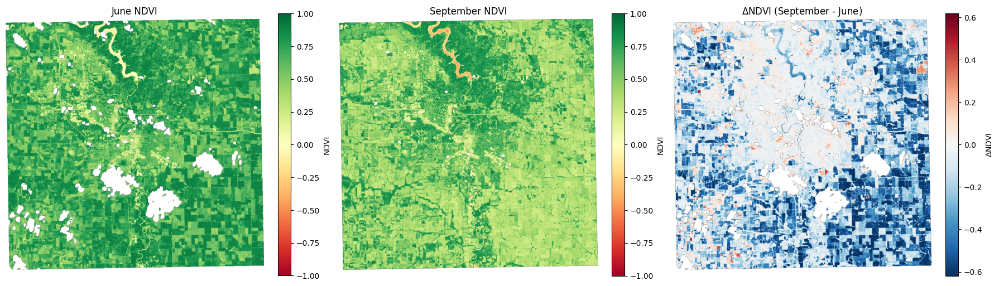

In [28]:
# ============================================================
# B2 — NDVI, scene means, and Delta NDVI
# ============================================================

def normalized_difference(a, b):
    denominator = a + b
    out = np.full(a.shape, np.nan, dtype=float)

    valid = (
        np.isfinite(a) &
        np.isfinite(b) &
        (denominator > 0)
    )

    out[valid] = (a[valid] - b[valid]) / denominator[valid]

    # Remove non-physical normalized-difference values.
    out[(out < -1) | (out > 1)] = np.nan
    return out

ndvi_june = normalized_difference(june_sr["NIR"], june_sr["Red"])
ndvi_sept = normalized_difference(sept_sr["NIR"], sept_sr["Red"])

delta_ndvi = ndvi_sept - ndvi_june

mean_ndvi_june = np.nanmean(ndvi_june)
mean_ndvi_sept = np.nanmean(ndvi_sept)
mean_delta = np.nanmean(delta_ndvi)

print(f"June mean NDVI      : {mean_ndvi_june:.4f}")
print(f"September mean NDVI : {mean_ndvi_sept:.4f}")
print(f"Mean ΔNDVI (Sep-Jun): {mean_delta:.4f}")
print(f"June valid NDVI pixels      : {np.isfinite(ndvi_june).sum():,}")
print(f"September valid NDVI pixels : {np.isfinite(ndvi_sept).sum():,}")
print(f"Valid ΔNDVI pixels          : {np.isfinite(delta_ndvi).sum():,}")

delta_limit = np.nanpercentile(np.abs(delta_ndvi), 98)
delta_norm = TwoSlopeNorm(vmin=-delta_limit, vcenter=0, vmax=delta_limit)

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

im1 = axes[0].imshow(ndvi_june, cmap="RdYlGn", vmin=-1, vmax=1)
axes[0].set_title("June NDVI")
axes[0].axis("off")
plt.colorbar(im1, ax=axes[0], fraction=0.046, label="NDVI")

im2 = axes[1].imshow(ndvi_sept, cmap="RdYlGn", vmin=-1, vmax=1)
axes[1].set_title("September NDVI")
axes[1].axis("off")
plt.colorbar(im2, ax=axes[1], fraction=0.046, label="NDVI")

im3 = axes[2].imshow(delta_ndvi, cmap="RdBu_r", norm=delta_norm)
axes[2].set_title(r"$\Delta$NDVI (September - June)")
axes[2].axis("off")
plt.colorbar(im3, ax=axes[2], fraction=0.046, label=r"$\Delta$NDVI")

plt.tight_layout()
plt.show()

### B2 result

Using the supplied scenes, the scene-average NDVI is approximately:

- **June: 0.6757**
- **September: 0.4854**

The average change is therefore about **−0.1904**, indicating an overall decline in greenness from early June to mid-September over the valid overlapping scene. The spatial map is more informative than the average alone because individual agricultural fields do not all change in the same direction or by the same amount.

## B3) June NDWI, water mask, and water area

The Normalized Difference Water Index is calculated as

\[
NDWI=\frac{Green-NIR}{Green+NIR}
\]

Exploratory testing compared thresholds of 0.00, 0.05, 0.10, and 0.15. A threshold of **NDWI > 0.00** was retained because it preserved the main river and smaller open-water features, while larger thresholds progressively removed narrow water features.

Each Landsat pixel is \(30\,m \times 30\,m\), so the area of one pixel is

\[
900\,m^2 = 0.0009\,km^2
\]

Water threshold : NDWI > 0.00
Water pixels    : 5,656
Water area      : 5.090 km²


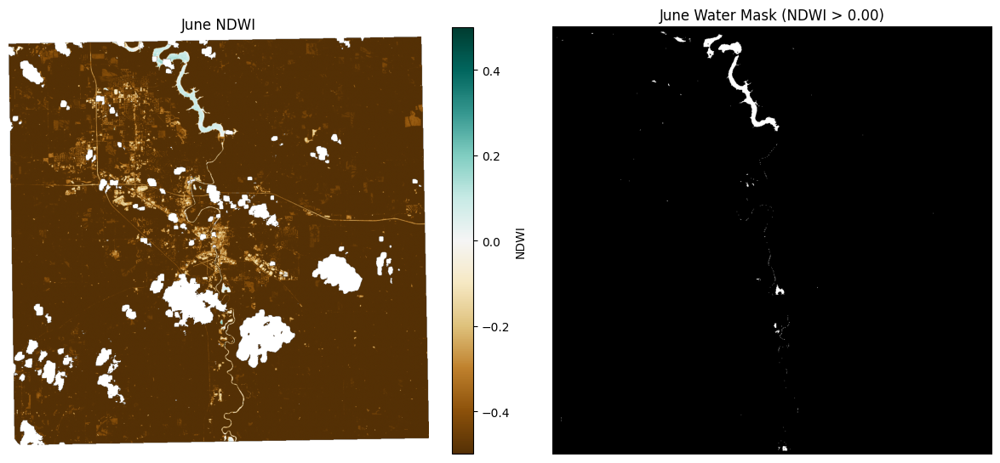

In [29]:
# ============================================================
# B3 — June NDWI, water mask, and area
# ============================================================

ndwi_june = normalized_difference(june_sr["Green"], june_sr["NIR"])

WATER_THRESHOLD = 0.00

water_june = (
    np.isfinite(ndwi_june) &
    (ndwi_june > WATER_THRESHOLD)
)

pixel_area_km2 = (30 * 30) / 1_000_000
water_pixels = int(water_june.sum())
water_area_km2 = water_pixels * pixel_area_km2

print(f"Water threshold : NDWI > {WATER_THRESHOLD:.2f}")
print(f"Water pixels    : {water_pixels:,}")
print(f"Water area      : {water_area_km2:.3f} km²")

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5))

im1 = axes[0].imshow(ndwi_june, cmap="BrBG", vmin=-0.5, vmax=0.5)
axes[0].set_title("June NDWI")
axes[0].axis("off")
plt.colorbar(im1, ax=axes[0], fraction=0.046, label="NDWI")

axes[1].imshow(water_june, cmap="gray")
axes[1].set_title("June Water Mask (NDWI > 0.00)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### B3 result and uncertainty

The threshold **NDWI > 0.00** identifies **5,656 water pixels**, corresponding to approximately **5.090 km²** of open water.

One important uncertainty is **threshold sensitivity at shorelines and narrow channels**. A 30 m pixel can contain both land and water, so a mixed shoreline pixel may have an NDWI value below zero even though part of the pixel is water. Conversely, some bright or unusual non-water surfaces can occasionally produce relatively high NDWI. The reported water area should therefore be interpreted as a threshold-based estimate rather than an exact shoreline inventory.

## B4) June LST and the NDVI–temperature contrast

The June `ST_B10` layer is converted to land surface temperature using the stated scale factor:

\[
LST[K]=DN\times0.00341802+149.0
\]

Because `ST_B10` is already the Level-2 LST retrieval, no additional emissivity correction is applied.

To compare contrasting vegetation conditions, the exploratory June NDVI distribution was used to define two deliberately separated groups:

- **Low NDVI:** \(NDVI \leq 0.40\)
- **High NDVI:** \(NDVI \geq 0.80\)

These are analysis thresholds for this scene, not universal land-cover definitions. Open-water pixels identified by **NDWI > 0.00** are excluded from both groups because water has a different thermal behavior and would confound a vegetation-focused comparison.

Low NDVI threshold  : NDVI <= 0.40
High NDVI threshold : NDVI >= 0.80
Open water          : excluded using NDWI > 0.00

LOW-NDVI GROUP
Valid pixels : 62,650
Mean LST     : 316.69 K
Mean LST     : 43.54 °C

HIGH-NDVI GROUP
Valid pixels : 311,554
Mean LST     : 308.37 K
Mean LST     : 35.22 °C

LST CONTRAST
Mean LST(low NDVI) - Mean LST(high NDVI) = 8.33 K


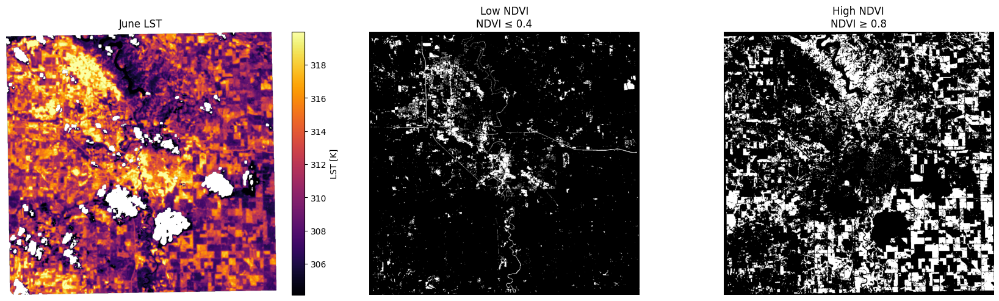

In [30]:
# ============================================================
# B4 — June LST vs low/high NDVI
# ============================================================

LOW_NDVI_THRESHOLD = 0.40
HIGH_NDVI_THRESHOLD = 0.80

low_ndvi_mask = (
    np.isfinite(ndvi_june) &
    np.isfinite(june_lst) &
    (~water_june) &
    (ndvi_june <= LOW_NDVI_THRESHOLD)
)

high_ndvi_mask = (
    np.isfinite(ndvi_june) &
    np.isfinite(june_lst) &
    (~water_june) &
    (ndvi_june >= HIGH_NDVI_THRESHOLD)
)

lst_low = june_lst[low_ndvi_mask]
lst_high = june_lst[high_ndvi_mask]

mean_lst_low = np.mean(lst_low)
mean_lst_high = np.mean(lst_high)
lst_contrast = mean_lst_low - mean_lst_high

print(f"Low NDVI threshold  : NDVI <= {LOW_NDVI_THRESHOLD:.2f}")
print(f"High NDVI threshold : NDVI >= {HIGH_NDVI_THRESHOLD:.2f}")
print("Open water          : excluded using NDWI > 0.00")

print("\nLOW-NDVI GROUP")
print(f"Valid pixels : {len(lst_low):,}")
print(f"Mean LST     : {mean_lst_low:.2f} K")
print(f"Mean LST     : {mean_lst_low - 273.15:.2f} °C")

print("\nHIGH-NDVI GROUP")
print(f"Valid pixels : {len(lst_high):,}")
print(f"Mean LST     : {mean_lst_high:.2f} K")
print(f"Mean LST     : {mean_lst_high - 273.15:.2f} °C")

print("\nLST CONTRAST")
print(
    f"Mean LST(low NDVI) - Mean LST(high NDVI) = "
    f"{lst_contrast:.2f} K"
)

# Robust display limits for the LST map only.
lst_vmin, lst_vmax = np.nanpercentile(june_lst, [2, 98])

fig, axes = plt.subplots(1, 3, figsize=(17, 5))

im = axes[0].imshow(
    june_lst,
    cmap="inferno",
    vmin=lst_vmin,
    vmax=lst_vmax
)
axes[0].set_title("June LST")
axes[0].axis("off")
plt.colorbar(im, ax=axes[0], fraction=0.046, label="LST [K]")

axes[1].imshow(low_ndvi_mask, cmap="gray")
axes[1].set_title(f"Low NDVI\nNDVI ≤ {LOW_NDVI_THRESHOLD}")
axes[1].axis("off")

axes[2].imshow(high_ndvi_mask, cmap="gray")
axes[2].set_title(f"High NDVI\nNDVI ≥ {HIGH_NDVI_THRESHOLD}")
axes[2].axis("off")

plt.tight_layout()
plt.show()

### B4 result and interpretation

For the supplied June scene:

- **Low-NDVI group:** 62,650 valid pixels; mean LST = **316.69 K (43.54 °C)**
- **High-NDVI group:** 311,554 valid pixels; mean LST = **308.37 K (35.22 °C)**

Therefore,

\[
\overline{LST}_{lowNDVI}-\overline{LST}_{highNDVI}
= \mathbf{8.33\ K}
\]

The low-NDVI surfaces are therefore about **8.33 K warmer on average** than the high-NDVI surfaces in this June scene. The pattern is consistent with the expected cooling associated with vegetated surfaces through evapotranspiration and shading.

However, the 8.33 K contrast should **not** be interpreted as a pure causal vegetation-cooling effect. The two NDVI groups can also differ in impervious cover, soil moisture, surface material, albedo, shading, topography, and land use. NDVI itself is also correlated with several of these surface properties. The comparison demonstrates a strong association in this scene, not an isolated vegetation-only experiment.

Pearson correlation (June NDVI vs LST, non-water): -0.687


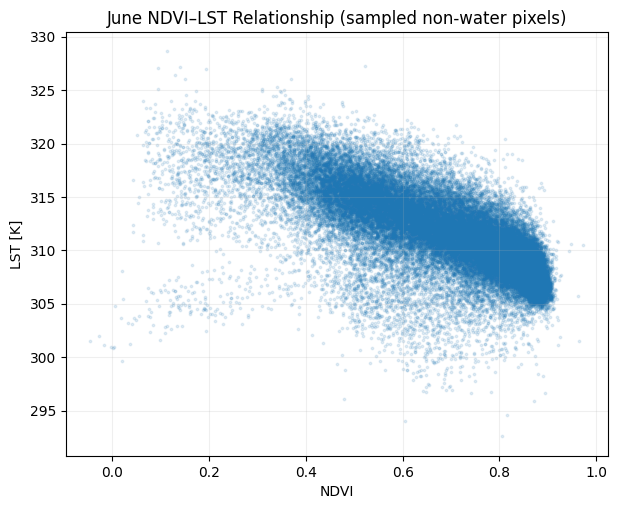

In [31]:
# ============================================================
# i am also running this supporting diagnostic fro my discussion- June NDVI vs LST
# ============================================================

relationship_mask = (
    np.isfinite(ndvi_june) &
    np.isfinite(june_lst) &
    (~water_june)
)

x = ndvi_june[relationship_mask]
y = june_lst[relationship_mask]

corr = np.corrcoef(x, y)[0, 1]
print(f"Pearson correlation (June NDVI vs LST, non-water): {corr:.3f}")

rng = np.random.default_rng(42)
n = min(50000, len(x))
idx = rng.choice(len(x), size=n, replace=False)

plt.figure(figsize=(7, 5.5))
plt.scatter(x[idx], y[idx], s=3, alpha=0.12)
plt.xlabel("NDVI")
plt.ylabel("LST [K]")
plt.title("June NDVI–LST Relationship (sampled non-water pixels)")
plt.grid(alpha=0.2)
plt.show()

## B5) 2 × 2 summary figure
The final summary combines the four requested products:
1. June NDVI
2. September NDVI
3. \(\Delta NDVI = September - June\)
4. June LST [K]

The \(\Delta NDVI\) panel uses a diverging color scale centered at zero so gains and losses are visually balanced.

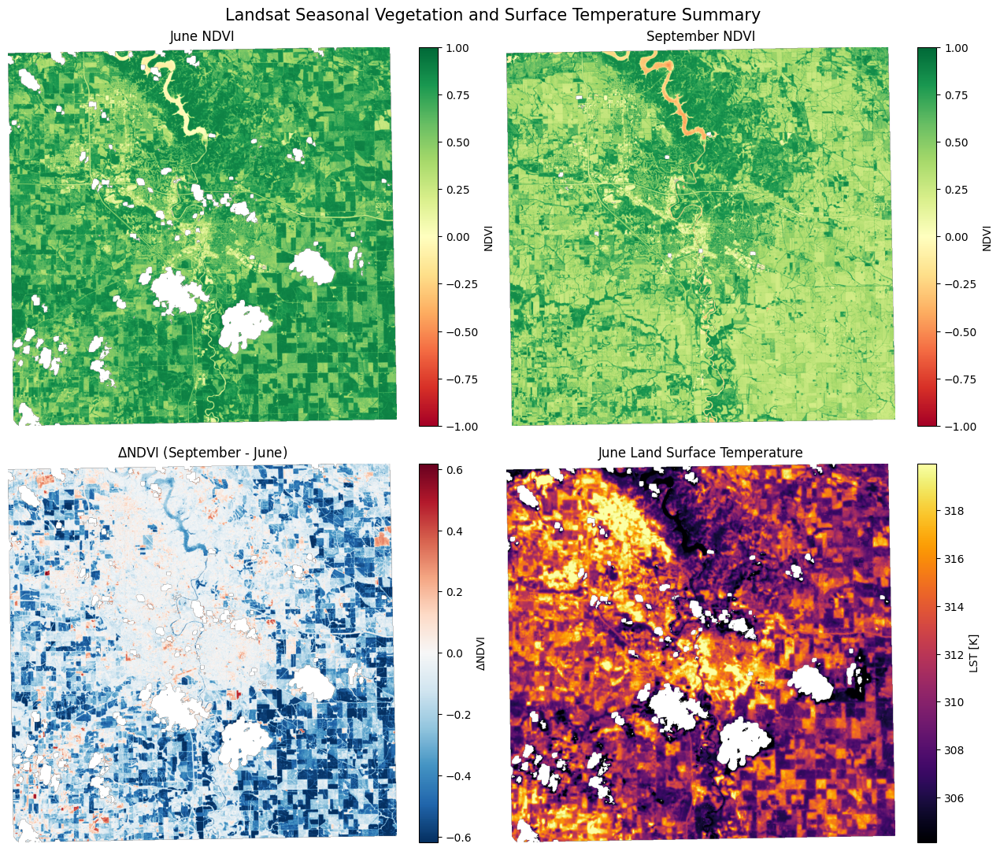

In [33]:
# ============================================================
# B5 2x2 summary figure
# ============================================================

delta_limit = np.nanpercentile(np.abs(delta_ndvi), 98)
delta_norm = TwoSlopeNorm(
    vmin=-delta_limit,
    vcenter=0,
    vmax=delta_limit
)

lst_vmin, lst_vmax = np.nanpercentile(june_lst, [2, 98])

fig, axes = plt.subplots(2, 2, figsize=(13, 11))

im1 = axes[0,0].imshow(ndvi_june, cmap="RdYlGn", vmin=-1, vmax=1)
axes[0,0].set_title("June NDVI")
axes[0,0].axis("off")
plt.colorbar(im1, ax=axes[0,0], fraction=0.046, label="NDVI")

im2 = axes[0,1].imshow(ndvi_sept, cmap="RdYlGn", vmin=-1, vmax=1)
axes[0,1].set_title("September NDVI")
axes[0,1].axis("off")
plt.colorbar(im2, ax=axes[0,1], fraction=0.046, label="NDVI")

im3 = axes[1,0].imshow(delta_ndvi, cmap="RdBu_r", norm=delta_norm)
axes[1,0].set_title(r"$\Delta$NDVI (September - June)")
axes[1,0].axis("off")
plt.colorbar(im3, ax=axes[1,0], fraction=0.046, label=r"$\Delta$NDVI")

im4 = axes[1,1].imshow(
    june_lst,
    cmap="inferno",
    vmin=lst_vmin,
    vmax=lst_vmax
)
axes[1,1].set_title("June Land Surface Temperature")
axes[1,1].axis("off")
plt.colorbar(im4, ax=axes[1,1], fraction=0.046, label="LST [K]")

plt.suptitle("Landsat Seasonal Vegetation and Surface Temperature Summary", fontsize=15)
plt.tight_layout()
plt.show()

# Part C. Discussion

## What changed between June and September, and why?

The clearest scene-wide change between June and September is a decrease in vegetation greenness. Mean NDVI decreased from **0.6757 in June** to **0.4854 in September**.

For pixels that were valid on both dates, the mean pixel-wise change was:

$$
\Delta NDVI = NDVI_{September} - NDVI_{June} = -0.1904
$$

The ΔNDVI map shows that this decline was not spatially uniform, with different agricultural fields showing different magnitudes of change.

In this Iowa agricultural landscape, the decline is consistent with seasonal crop and vegetation phenology. By mid-September, many crops are approaching maturity or beginning senescence, which is associated with declining chlorophyll, canopy drying, and reduced photosynthetic activity. These changes generally reduce NIR reflectance and can increase red reflectance, resulting in lower NDVI. Differences among fields may be related to crop type, planting date, management practices, moisture conditions, and maturity stage. However, these specific causes cannot be confirmed from the two Landsat images alone.

## Where is the LST–vegetation relationship strongest, and what does it imply for urban heat mitigation?

The inverse relationship between vegetation and land surface temperature is most evident across the **urban, built-up, and sparsely vegetated portions of the scene**, where low-NDVI surfaces generally correspond to higher LST. In contrast, densely vegetated agricultural fields and wooded areas tend to have lower surface temperatures.

After excluding open water:

- Low-NDVI pixels, **NDVI ≤ 0.40**, had a mean LST of **316.69 K**
- High-NDVI pixels, **NDVI ≥ 0.80**, had a mean LST of **308.37 K**

The LST contrast was calculated as:

$$
\Delta LST =
\overline{LST}_{low} -
\overline{LST}_{high}
$$

$$
\Delta LST =
316.69 - 308.37
= 8.33\ K
$$

Therefore, the low-NDVI surfaces were on average **8.33 K warmer** than the high-NDVI surfaces.

This result suggests that areas with greater vegetation cover are associated with cooler land surface temperatures, which is consistent with the effects of **shading and evapotranspiration**. For urban heat mitigation, this supports maintaining or increasing tree canopy and other vegetated cover, particularly around hot impervious surfaces.

However, the **8.33 K difference should not be interpreted as a purely causal vegetation-cooling effect**. Low- and high-NDVI surfaces also differ in impervious cover, soil moisture, albedo, surface materials, shading, and land use. Therefore, the comparison demonstrates a strong association between vegetation and LST in this scene rather than the exact cooling that would result from adding vegetation.

## What cannot be determined from optical and thermal imagery alone?

Optical reflectance and thermal imagery can identify spatial patterns of vegetation condition and surface temperature, but they cannot fully explain the processes responsible for those patterns.

From these two Landsat images alone, I cannot reliably determine:

- crop species or detailed crop-management history for each field;
- irrigation status or rooting-zone soil moisture;
- recent precipitation and plant-available water;
- air temperature, humidity, wind, or local atmospheric conditions;
- actual evapotranspiration or stomatal conductance;
- whether low NDVI is specifically caused by harvest, senescence, bare soil, built surfaces, or another land-cover condition without additional information;
- the amount of temperature reduction caused by vegetation alone;
- socioeconomic or management decisions responsible for the observed land-cover patterns.

Therefore, the Landsat optical and thermal products are useful for detecting and mapping spatial and seasonal patterns, but explaining the underlying causes would require additional information such as meteorological observations, land-cover or crop data, soil-moisture measurements, and management information.

Declaration:
I have used chatGpt to enhance and polish the quality fo this code.